In [85]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import time
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset

In [86]:
def generate_random_samples(batch, read = "/Users/maks/Documents/MSc_project/data/features", sequence_length = 60):
    """
    A function that creates a list of independent arrays that are to serve as samples for processing later.
    read is the directory where Excel files containing variables are stored;
    batch is the number of samples that will be generated;
    sequence length is the length of each sample.
    Returns a list of numpy arrays.
    """

    def load_excel(file_path):
        """
        Extracts sheets from Excel files given a file directory.
        """
        excel_file = pd.ExcelFile(file_path)
        
        sheets = {sheet_name: pd.read_excel(excel_file, sheet_name = sheet_name) for sheet_name in excel_file.sheet_names}

        return sheets
    
    def random_file(read):
        """
        Chooses a random file from a provided directory.
        """
        files = [f for f in os.listdir(read) if f.endswith(".xlsx") and not f.startswith(".")]
        
        if not files:
            raise FileNotFoundError("No Excel files found in the directory")
        
        return os.path.join(read, random.choice(files))
    
    def normalise_columns(df, columns):
        """
        Normalises specified columns between -1 and 1.
        """

        for column in columns:
            max_val = df[column].max()
            min_val = df[column].min()
            df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1

        return df

    def sampler(sheet_data, sequence_length):
        """
        Randomly creates a sample from an Excel sheet.
        sheet_data are sheets representing time series segments from where data is going to be sampled
        sequence_length is the number of points each sample will contain.
        """

        #Normalises velocities and angular velocities using normalise_columns
        columns = ["velocity_x", "velocity_y", "velocity_z", "angular_velocity_yz", "angular_velocity_xz", "angular_velocity_xy"]
        sheet_data = normalise_columns(sheet_data, columns)

        num_points = len(sheet_data)

        if num_points < sequence_length:
            return None
        
        start_index = random.randint(0, num_points - sequence_length)
        end_index = start_index + sequence_length
        sample = sheet_data.iloc[start_index : end_index].to_numpy()

        return sample #Transposes the samle to switch rows and columns
    
    def weighted_random_choice(sheets):
        """
        Assigns weights to sheets based on the length of each sheet.
        """
        total_points = sum(len(data) for data in sheets.values())
        weights = [len(data) / total_points for data in sheets.values()]

        return random.choices(list(sheets.keys()), weights = weights, k = 1)[0]
    
    #Initializes list to strore sample arrays
    samples = []

    while len(samples) < batch:
        file_path = random_file(read)
        sheets = load_excel(file_path)

        while len(samples) < batch:
            sheet_name = weighted_random_choice(sheets)
            sheet_data = sheets[sheet_name][["velocity_x", "velocity_y", "velocity_z", "tortuosity3d", "angular_velocity_yz", "angular_velocity_xz", "angular_velocity_xy"]]
            sample = sampler(sheet_data, sequence_length)

            if sample is not None:
                samples.append(sample)

            #Stops once batch size is reached
            if len(samples) >= batch:
                break

    return samples

In [84]:
sample = generate_random_samples(2)
print(sample[0].shape)

(60, 7)


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1


In [87]:
#Class to contain our sampled time series data
class TimeSeriesData(Dataset):
    def __init__(self, no_samples):
        self.data = generate_random_samples(no_samples)
        self.data = torch.tensor(self.data, dtype = torch.float32)
    
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, i):
        return self.data[i]
    

In [88]:
#Convolutional autoencoder model
class ConvAutoencoder(nn.Module):
    def __init__(self):
        super(ConvAutoencoder, self).__init__()

        #Encoder
        self.encoder = nn.Sequential(
            nn.Conv1d(in_channels = 7, out_channels = 16, kernel_size = 3, stride = 1, padding = 1), #output: (16, 60)
            nn.BatchNorm1d(16),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size = 2, stride = 2), #output (16, 30)
            nn.Dropout(0.3),

            nn.Conv1d(in_channels = 16, out_channels = 32, kernel_size = 3, stride = 1, padding = 1), #output: (32, 30)
            nn.BatchNorm1d(32),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size = 2, stride = 2), #output: (32, 15)
            nn.Dropout(0.3),

            nn.Conv1d(in_channels = 32, out_channels = 64, kernel_size = 3, stride = 1, padding = 1),
            nn.BatchNorm1d(64),
            nn.ReLU(),
            nn.MaxPool1d(kernel_size = 2, stride = 2),
            nn.Dropout(0.3)
        )

        #Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose1d(in_channels = 64, out_channels = 32, kernel_size = 2, stride = 2, output_padding = 1),
            nn.BatchNorm1d(32),
            nn.ReLU(),
            nn.Dropout(0.3),

            nn.ConvTranspose1d(in_channels = 32, out_channels = 16, kernel_size = 2, stride = 2, output_padding = 0), #output: (16, 30)
            nn.BatchNorm1d(16),
            nn.ReLU(),
            nn.Dropout(0.3),

            nn.ConvTranspose1d(in_channels = 16, out_channels = 8, kernel_size = 2, stride = 2, output_padding = 0), #output: (8, 60)
            nn.BatchNorm1d(8),
            nn.ReLU(),
            nn.Dropout(0.3),
            
            nn.ConvTranspose1d(in_channels = 8, out_channels = 7, kernel_size = 3, stride = 1, padding = 1) #output: (7, 60)
            #potentially add activation if there will be a massive need to normalise the inputs
        )
    def forward(self, x):
        x = x.permute(0, 2, 1)
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        decoded = decoded.permute(0, 2, 1)
        return decoded
    
    def encode(self, x):
        x = x.permute(0, 2, 1)
        encoded = self.encoder(x)
        return encoded


In [1]:
#Dataset and dataloader parameters
no_samples = 480
batch_size = 32

In [90]:
#Model, loss function and optimiser
model = ConvAutoencoder()
criterion = nn.L1Loss()
optimiser = optim.AdamW(model.parameters(), lr = 0.001)

In [91]:
#Training loop
no_episodes = 50
epochs = 10
#os.makedirs("/Users/maks/Documents/MSc_project/data/hidden_layer_representations/day_1", exist_ok = True)

for episode in range(no_episodes):
    print(f"Starting episode {episode + 1}/{no_episodes}")

    #Generates dataset
    dataset = TimeSeriesData(no_samples)
    dataloader = DataLoader(dataset, batch_size = batch_size, shuffle = True)

    #Records start time for an episode
    start_time = time.time()

    for epoch in range(epochs):
        epoch_loss = 0.0
        for batch_data in dataloader:
            #Forward pass
            output = model(batch_data)
            loss = criterion(output, batch_data)

            #Backward pass
            optimiser.zero_grad()
            loss.backward()
            optimiser.step()

            epoch_loss += loss.item()

        average_epoch_loss = epoch_loss / len(dataloader)
        print(f"Episode {episode + 1 }, epoch [{epoch + 1}/{epochs}], loss: {average_epoch_loss}")

    #Records end time of the episode
    end_time = time.time()

    #Prints duration of the episode
    runtime = end_time - start_time
    print(f"Episode {episode + 1} completed in {runtime:.2f} seconds")

    #Saves hidden layer representation every 10 episodes
    if (episode + 1) % 10 == 0:
        hidden_representations = []
        for batch_data in dataloader:
            with torch.no_grad():
                hidden_repr = model.encode(batch_data)
                hidden_representations.append(hidden_repr.numpy())

        hidden_representations = np.concatenate(hidden_representations, axis = 0)
        np.save(f"/Users/maks/Documents/MSc_project/data/hidden_layer_representations/day_1/hidden_representations_episode_{episode + 1}.npy", hidden_representations)
        print(f"Saved hidden representations for episode {episode + 1}")

print("Training finished!")

Starting episode 1/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 1, epoch [1/10], loss: 598786287207.4778
Episode 1, epoch [2/10], loss: 598786295399.7303
Episode 1, epoch [3/10], loss: 598786314241.0193
Episode 1, epoch [4/10], loss: 598786302226.5927
Episode 1, epoch [5/10], loss: 598786281746.4156
Episode 1, epoch [6/10], loss: 598786282838.8724
Episode 1, epoch [7/10], loss: 598786288573.6313
Episode 1, epoch [8/10], loss: 598786304137.569
Episode 1, epoch [9/10], loss: 598786273280.6323
Episode 1, epoch [10/10], loss: 598786293761.5349
Episode 1 completed in 6.53 seconds
Starting episode 2/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 2, epoch [1/10], loss: 1.1790423234303793
Episode 2, epoch [2/10], loss: 1.12687033812205
Episode 2, epoch [3/10], loss: 1.0767014344533286
Episode 2, epoch [4/10], loss: 1.013960321744283
Episode 2, epoch [5/10], loss: 0.9366558273633321
Episode 2, epoch [6/10], loss: 0.8507436394691468
Episode 2, epoch [7/10], loss: 0.7861231883366903
Episode 2, epoch [8/10], loss: 0.7118680795033773
Episode 2, epoch [9/10], loss: 0.6582932710647583
Episode 2, epoch [10/10], loss: 0.636303985118866
Episode 2 completed in 6.59 seconds
Starting episode 3/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 3, epoch [1/10], loss: 3.2312743504842123
Episode 3, epoch [2/10], loss: 3.108040452003479
Episode 3, epoch [3/10], loss: 3.012297240893046
Episode 3, epoch [4/10], loss: 2.907142917315165
Episode 3, epoch [5/10], loss: 2.8237584511439007
Episode 3, epoch [6/10], loss: 2.7246318260828652
Episode 3, epoch [7/10], loss: 2.639142076174418
Episode 3, epoch [8/10], loss: 2.5638414065043134
Episode 3, epoch [9/10], loss: 2.4848326126734417
Episode 3, epoch [10/10], loss: 2.4216637055079144
Episode 3 completed in 6.43 seconds
Starting episode 4/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 4, epoch [1/10], loss: 0.9015987952550252
Episode 4, epoch [2/10], loss: 0.7747342904408773
Episode 4, epoch [3/10], loss: 0.7919477105140686
Episode 4, epoch [4/10], loss: 0.6956203142801921
Episode 4, epoch [5/10], loss: 0.717834719022115
Episode 4, epoch [6/10], loss: 0.699158501625061
Episode 4, epoch [7/10], loss: 0.6892678062121074
Episode 4, epoch [8/10], loss: 0.7035906990369161
Episode 4, epoch [9/10], loss: 0.7124972343444824
Episode 4, epoch [10/10], loss: 0.7053974191347758
Episode 4 completed in 6.50 seconds
Starting episode 5/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 5, epoch [1/10], loss: 0.8235546469688415
Episode 5, epoch [2/10], loss: 0.7347112933794657
Episode 5, epoch [3/10], loss: 0.7139986236890157
Episode 5, epoch [4/10], loss: 0.7169418553511302
Episode 5, epoch [5/10], loss: 0.7278157869974772
Episode 5, epoch [6/10], loss: 0.7448787808418273
Episode 5, epoch [7/10], loss: 0.675225571791331
Episode 5, epoch [8/10], loss: 0.672935668627421
Episode 5, epoch [9/10], loss: 0.6908062775929769
Episode 5, epoch [10/10], loss: 0.72841690381368
Episode 5 completed in 6.62 seconds
Starting episode 6/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 6, epoch [1/10], loss: 0.6385839859644572
Episode 6, epoch [2/10], loss: 0.597558202346166
Episode 6, epoch [3/10], loss: 0.5955690264701843
Episode 6, epoch [4/10], loss: 0.603628404935201
Episode 6, epoch [5/10], loss: 0.5779578447341919
Episode 6, epoch [6/10], loss: 0.563710876305898
Episode 6, epoch [7/10], loss: 0.5665483891963958
Episode 6, epoch [8/10], loss: 0.6111733059088389
Episode 6, epoch [9/10], loss: 0.5939915517965952
Episode 6, epoch [10/10], loss: 0.6026641428470612
Episode 6 completed in 6.65 seconds
Starting episode 7/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 7, epoch [1/10], loss: 155309148843.13086
Episode 7, epoch [2/10], loss: 155309153212.15588
Episode 7, epoch [3/10], loss: 155309153212.11325
Episode 7, epoch [4/10], loss: 155309153212.12375
Episode 7, epoch [5/10], loss: 155309153212.10605
Episode 7, epoch [6/10], loss: 155309153212.1541
Episode 7, epoch [7/10], loss: 155309153212.12924
Episode 7, epoch [8/10], loss: 155309153212.12314
Episode 7, epoch [9/10], loss: 155309166319.35822
Episode 7, epoch [10/10], loss: 155309153212.13397
Episode 7 completed in 6.49 seconds
Starting episode 8/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 8, epoch [1/10], loss: 0.5019761164983113
Episode 8, epoch [2/10], loss: 0.4998499035835266
Episode 8, epoch [3/10], loss: 0.4840649942557017
Episode 8, epoch [4/10], loss: 0.476715095837911
Episode 8, epoch [5/10], loss: 0.493753045797348
Episode 8, epoch [6/10], loss: 0.4549700438976288
Episode 8, epoch [7/10], loss: 0.4404593845208486
Episode 8, epoch [8/10], loss: 0.46712196071942647
Episode 8, epoch [9/10], loss: 0.43948856393496194
Episode 8, epoch [10/10], loss: 0.47252050042152405
Episode 8 completed in 6.58 seconds
Starting episode 9/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 9, epoch [1/10], loss: 0.6936853468418122
Episode 9, epoch [2/10], loss: 0.6767274936040243
Episode 9, epoch [3/10], loss: 0.6818061570326487
Episode 9, epoch [4/10], loss: 0.6629186511039734
Episode 9, epoch [5/10], loss: 0.6373659332593282
Episode 9, epoch [6/10], loss: 0.6383600910504659
Episode 9, epoch [7/10], loss: 0.6630547682444254
Episode 9, epoch [8/10], loss: 0.6341951767603556
Episode 9, epoch [9/10], loss: 0.6371123393376669
Episode 9, epoch [10/10], loss: 0.6448631584644318
Episode 9 completed in 6.56 seconds
Starting episode 10/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 10, epoch [1/10], loss: 1.0218295276165008
Episode 10, epoch [2/10], loss: 0.977980903784434
Episode 10, epoch [3/10], loss: 0.9981234431266784
Episode 10, epoch [4/10], loss: 0.9095357040564219
Episode 10, epoch [5/10], loss: 0.916880053281784
Episode 10, epoch [6/10], loss: 0.9284033377965292
Episode 10, epoch [7/10], loss: 0.8858307242393494
Episode 10, epoch [8/10], loss: 0.9865691502888997
Episode 10, epoch [9/10], loss: 0.8938262522220611
Episode 10, epoch [10/10], loss: 0.9230594078699748
Episode 10 completed in 6.59 seconds
Saved hidden representations for episode 10
Starting episode 11/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 11, epoch [1/10], loss: 0.7272585749626159
Episode 11, epoch [2/10], loss: 0.7426318367322285
Episode 11, epoch [3/10], loss: 0.7534134387969971
Episode 11, epoch [4/10], loss: 0.7451777438322703
Episode 11, epoch [5/10], loss: 0.7108701209227244
Episode 11, epoch [6/10], loss: 0.7459668358167012
Episode 11, epoch [7/10], loss: 0.7670467893282572
Episode 11, epoch [8/10], loss: 0.7320039947827657
Episode 11, epoch [9/10], loss: 0.6892635742823283
Episode 11, epoch [10/10], loss: 0.7316321730613708
Episode 11 completed in 6.39 seconds
Starting episode 12/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 12, epoch [1/10], loss: 463043852154.7563
Episode 12, epoch [2/10], loss: 463043854340.068
Episode 12, epoch [3/10], loss: 463043836863.52844
Episode 12, epoch [4/10], loss: 463043848877.08295
Episode 12, epoch [5/10], loss: 463043863077.5475
Episode 12, epoch [6/10], loss: 463043853246.254
Episode 12, epoch [7/10], loss: 463043866355.0255
Episode 12, epoch [8/10], loss: 463043836863.6709
Episode 12, epoch [9/10], loss: 463043854339.2008
Episode 12, epoch [10/10], loss: 463043864170.08386
Episode 12 completed in 6.52 seconds
Starting episode 13/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 13, epoch [1/10], loss: 2540211679.0659685
Episode 13, epoch [2/10], loss: 2540211679.0336356
Episode 13, epoch [3/10], loss: 2540211678.984414
Episode 13, epoch [4/10], loss: 2540211679.0308695
Episode 13, epoch [5/10], loss: 2540211679.0166197
Episode 13, epoch [6/10], loss: 2540211678.9921885
Episode 13, epoch [7/10], loss: 2540211678.9801087
Episode 13, epoch [8/10], loss: 2540211678.987886
Episode 13, epoch [9/10], loss: 2540211678.989344
Episode 13, epoch [10/10], loss: 2540211678.9596777
Episode 13 completed in 7.01 seconds
Starting episode 14/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 14, epoch [1/10], loss: 9570889461.881218
Episode 14, epoch [2/10], loss: 9570890553.952047
Episode 14, epoch [3/10], loss: 9570890553.71316
Episode 14, epoch [4/10], loss: 9570890553.74664
Episode 14, epoch [5/10], loss: 9570890553.587126
Episode 14, epoch [6/10], loss: 9570889461.320204
Episode 14, epoch [7/10], loss: 9570889461.484762
Episode 14, epoch [8/10], loss: 9570889461.295895
Episode 14, epoch [9/10], loss: 9570890553.588558
Episode 14, epoch [10/10], loss: 9570889461.195234
Episode 14 completed in 6.33 seconds
Starting episode 15/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 15, epoch [1/10], loss: 1301516710.1728776
Episode 15, epoch [2/10], loss: 1301516709.1134317
Episode 15, epoch [3/10], loss: 1301516710.307426
Episode 15, epoch [4/10], loss: 1301516709.6202354
Episode 15, epoch [5/10], loss: 1301516710.5685942
Episode 15, epoch [6/10], loss: 1301516709.748992
Episode 15, epoch [7/10], loss: 1301516710.8548937
Episode 15, epoch [8/10], loss: 1301516710.0605736
Episode 15, epoch [9/10], loss: 1301516710.5356102
Episode 15, epoch [10/10], loss: 1301516709.2470315
Episode 15 completed in 6.46 seconds
Starting episode 16/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 16, epoch [1/10], loss: 313592603.086815
Episode 16, epoch [2/10], loss: 313592602.9689319
Episode 16, epoch [3/10], loss: 313592603.01137793
Episode 16, epoch [4/10], loss: 313592602.9628486
Episode 16, epoch [5/10], loss: 313592602.5142402
Episode 16, epoch [6/10], loss: 313592602.8143057
Episode 16, epoch [7/10], loss: 313592602.80668586
Episode 16, epoch [8/10], loss: 313592599.1044224
Episode 16, epoch [9/10], loss: 313592602.6588
Episode 16, epoch [10/10], loss: 313592602.8133929
Episode 16 completed in 6.39 seconds
Starting episode 17/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 17, epoch [1/10], loss: 1.9700647592544556
Episode 17, epoch [2/10], loss: 1.6959343115488688
Episode 17, epoch [3/10], loss: 1.733854111035665
Episode 17, epoch [4/10], loss: 1.7564597050348918
Episode 17, epoch [5/10], loss: 1.9455729722976685
Episode 17, epoch [6/10], loss: 1.5244494040807088
Episode 17, epoch [7/10], loss: 1.4195092519124348
Episode 17, epoch [8/10], loss: 1.58119424978892
Episode 17, epoch [9/10], loss: 1.6127020279566446
Episode 17, epoch [10/10], loss: 1.7143657167752584
Episode 17 completed in 7.30 seconds
Starting episode 18/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 18, epoch [1/10], loss: 2056806.4204674086
Episode 18, epoch [2/10], loss: 2056806.295918866
Episode 18, epoch [3/10], loss: 2056806.2165153385
Episode 18, epoch [4/10], loss: 2056806.4646812042
Episode 18, epoch [5/10], loss: 2056806.4114194831
Episode 18, epoch [6/10], loss: 2056806.3699773948
Episode 18, epoch [7/10], loss: 2056806.1023816825
Episode 18, epoch [8/10], loss: 2056806.0002901277
Episode 18, epoch [9/10], loss: 2056806.298517835
Episode 18, epoch [10/10], loss: 2056806.3351905108
Episode 18 completed in 6.65 seconds
Starting episode 19/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 19, epoch [1/10], loss: 2.443614919980367
Episode 19, epoch [2/10], loss: 1.7319114367167154
Episode 19, epoch [3/10], loss: 1.5841419299443562
Episode 19, epoch [4/10], loss: 1.4089336315790812
Episode 19, epoch [5/10], loss: 1.3675841490427654
Episode 19, epoch [6/10], loss: 1.3762518604596456
Episode 19, epoch [7/10], loss: 1.390690517425537
Episode 19, epoch [8/10], loss: 1.399470853805542
Episode 19, epoch [9/10], loss: 1.328213095664978
Episode 19, epoch [10/10], loss: 1.3274420420328776
Episode 19 completed in 6.48 seconds
Starting episode 20/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 20, epoch [1/10], loss: 2.222663640975952
Episode 20, epoch [2/10], loss: 1.7021389643351237
Episode 20, epoch [3/10], loss: 1.357836087544759
Episode 20, epoch [4/10], loss: 1.29454554716746
Episode 20, epoch [5/10], loss: 1.1632441282272339
Episode 20, epoch [6/10], loss: 1.1080152948697408
Episode 20, epoch [7/10], loss: 1.0739299654960632
Episode 20, epoch [8/10], loss: 0.9713028907775879
Episode 20, epoch [9/10], loss: 1.0352653702100119
Episode 20, epoch [10/10], loss: 0.8882975737253825
Episode 20 completed in 6.61 seconds
Saved hidden representations for episode 20
Starting episode 21/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 21, epoch [1/10], loss: 0.8780683557192485
Episode 21, epoch [2/10], loss: 0.7813410838445027
Episode 21, epoch [3/10], loss: 0.7408986290295919
Episode 21, epoch [4/10], loss: 0.6445615092913309
Episode 21, epoch [5/10], loss: 0.6713587840398153
Episode 21, epoch [6/10], loss: 0.625391415754954
Episode 21, epoch [7/10], loss: 0.6022026459376018
Episode 21, epoch [8/10], loss: 0.5908950606981913
Episode 21, epoch [9/10], loss: 0.5270256658395132
Episode 21, epoch [10/10], loss: 0.5343149642149607
Episode 21 completed in 6.82 seconds
Starting episode 22/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 22, epoch [1/10], loss: 352163127842.82007
Episode 22, epoch [2/10], loss: 352163137672.9836
Episode 22, epoch [3/10], loss: 352163144226.67676
Episode 22, epoch [4/10], loss: 352163128935.03595
Episode 22, epoch [5/10], loss: 352163131119.36676
Episode 22, epoch [6/10], loss: 352163132211.7312
Episode 22, epoch [7/10], loss: 352163155149.33185
Episode 22, epoch [8/10], loss: 352163132211.6166
Episode 22, epoch [9/10], loss: 352163140949.85944
Episode 22, epoch [10/10], loss: 352163131119.42676
Episode 22 completed in 6.66 seconds
Starting episode 23/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 23, epoch [1/10], loss: 7124982.054635632
Episode 23, epoch [2/10], loss: 7124981.941046425
Episode 23, epoch [3/10], loss: 7124982.006608907
Episode 23, epoch [4/10], loss: 7124982.004060324
Episode 23, epoch [5/10], loss: 7124981.958346351
Episode 23, epoch [6/10], loss: 7124981.90939612
Episode 23, epoch [7/10], loss: 7124981.94611975
Episode 23, epoch [8/10], loss: 7124982.194903894
Episode 23, epoch [9/10], loss: 7124981.9623971665
Episode 23, epoch [10/10], loss: 7124981.831759512
Episode 23 completed in 7.36 seconds
Starting episode 24/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 24, epoch [1/10], loss: 0.8354934215545654
Episode 24, epoch [2/10], loss: 0.7602968653043111
Episode 24, epoch [3/10], loss: 0.6847999056180318
Episode 24, epoch [4/10], loss: 0.696436862150828
Episode 24, epoch [5/10], loss: 0.719734783967336
Episode 24, epoch [6/10], loss: 0.6865511039892832
Episode 24, epoch [7/10], loss: 0.6506034016609192
Episode 24, epoch [8/10], loss: 0.5894115130106609
Episode 24, epoch [9/10], loss: 0.6517714599768321
Episode 24, epoch [10/10], loss: 0.5995633045832316
Episode 24 completed in 6.82 seconds
Starting episode 25/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 25, epoch [1/10], loss: 0.9223820328712463
Episode 25, epoch [2/10], loss: 0.8659313797950745
Episode 25, epoch [3/10], loss: 0.8721088767051697
Episode 25, epoch [4/10], loss: 0.8443513671557109
Episode 25, epoch [5/10], loss: 0.8085786422093709
Episode 25, epoch [6/10], loss: 0.841666599114736
Episode 25, epoch [7/10], loss: 0.8262555718421936
Episode 25, epoch [8/10], loss: 0.85892147620519
Episode 25, epoch [9/10], loss: 0.8225136717160543
Episode 25, epoch [10/10], loss: 0.8041906396547953
Episode 25 completed in 6.48 seconds
Starting episode 26/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 26, epoch [1/10], loss: 10.093771016597747
Episode 26, epoch [2/10], loss: 9.831199018160502
Episode 26, epoch [3/10], loss: 9.707038839658102
Episode 26, epoch [4/10], loss: 9.648651941617329
Episode 26, epoch [5/10], loss: 9.569516849517822
Episode 26, epoch [6/10], loss: 9.553551657994587
Episode 26, epoch [7/10], loss: 9.498438493410747
Episode 26, epoch [8/10], loss: 9.544629367192586
Episode 26, epoch [9/10], loss: 9.430471563339234
Episode 26, epoch [10/10], loss: 9.179277118047079
Episode 26 completed in 6.50 seconds
Starting episode 27/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 27, epoch [1/10], loss: 1.4417133331298828
Episode 27, epoch [2/10], loss: 1.0171209136644999
Episode 27, epoch [3/10], loss: 0.8516210675239563
Episode 27, epoch [4/10], loss: 0.6660732169946034
Episode 27, epoch [5/10], loss: 0.5315239111582438
Episode 27, epoch [6/10], loss: 0.45767238140106203
Episode 27, epoch [7/10], loss: 0.42043997049331666
Episode 27, epoch [8/10], loss: 0.41039084593454994
Episode 27, epoch [9/10], loss: 0.4126001795132955
Episode 27, epoch [10/10], loss: 0.40439865390459695
Episode 27 completed in 6.59 seconds
Starting episode 28/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 28, epoch [1/10], loss: 0.7413101812203725
Episode 28, epoch [2/10], loss: 0.6826648255189259
Episode 28, epoch [3/10], loss: 0.6768922825654348
Episode 28, epoch [4/10], loss: 0.676514188448588
Episode 28, epoch [5/10], loss: 0.6879010319709777
Episode 28, epoch [6/10], loss: 0.6743773261706034
Episode 28, epoch [7/10], loss: 0.7046025335788727
Episode 28, epoch [8/10], loss: 0.6562575658162435
Episode 28, epoch [9/10], loss: 0.716269056002299
Episode 28, epoch [10/10], loss: 0.6410672982533773
Episode 28 completed in 6.43 seconds
Starting episode 29/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 29, epoch [1/10], loss: 2181573.560202575
Episode 29, epoch [2/10], loss: 2181572.669580702
Episode 29, epoch [3/10], loss: 2181572.452569874
Episode 29, epoch [4/10], loss: 2181572.6371927024
Episode 29, epoch [5/10], loss: 2181572.487680586
Episode 29, epoch [6/10], loss: 2181572.387079668
Episode 29, epoch [7/10], loss: 2181572.453186909
Episode 29, epoch [8/10], loss: 2181572.1693459274
Episode 29, epoch [9/10], loss: 2181572.3712443034
Episode 29, epoch [10/10], loss: 2181572.335724672
Episode 29 completed in 7.29 seconds
Starting episode 30/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 30, epoch [1/10], loss: 857.6407405296961
Episode 30, epoch [2/10], loss: 857.3402134180069
Episode 30, epoch [3/10], loss: 857.4395939469338
Episode 30, epoch [4/10], loss: 857.0278534611066
Episode 30, epoch [5/10], loss: 857.4111244996388
Episode 30, epoch [6/10], loss: 857.3455466151238
Episode 30, epoch [7/10], loss: 857.0917164087296
Episode 30, epoch [8/10], loss: 857.1435887098312
Episode 30, epoch [9/10], loss: 857.2860222856203
Episode 30, epoch [10/10], loss: 857.3561241388321
Episode 30 completed in 6.69 seconds
Saved hidden representations for episode 30
Starting episode 31/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 31, epoch [1/10], loss: 0.668518082300822
Episode 31, epoch [2/10], loss: 0.5936746021111806
Episode 31, epoch [3/10], loss: 0.5394348581631978
Episode 31, epoch [4/10], loss: 0.45689735412597654
Episode 31, epoch [5/10], loss: 0.49759581287701926
Episode 31, epoch [6/10], loss: 0.5026300529638926
Episode 31, epoch [7/10], loss: 0.46817861795425414
Episode 31, epoch [8/10], loss: 0.49105610052744547
Episode 31, epoch [9/10], loss: 0.47003440658251444
Episode 31, epoch [10/10], loss: 0.4621404449144999
Episode 31 completed in 6.76 seconds
Starting episode 32/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 32, epoch [1/10], loss: 0.500632381439209
Episode 32, epoch [2/10], loss: 0.4030520379543304
Episode 32, epoch [3/10], loss: 0.3825180967648824
Episode 32, epoch [4/10], loss: 0.37027157147725426
Episode 32, epoch [5/10], loss: 0.36325816114743553
Episode 32, epoch [6/10], loss: 0.3645431935787201
Episode 32, epoch [7/10], loss: 0.35933562318483986
Episode 32, epoch [8/10], loss: 0.36629198988278705
Episode 32, epoch [9/10], loss: 0.3582134266694387
Episode 32, epoch [10/10], loss: 0.3631153106689453
Episode 32 completed in 6.63 seconds
Starting episode 33/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 33, epoch [1/10], loss: 2.911730873584747
Episode 33, epoch [2/10], loss: 2.9047505299250287
Episode 33, epoch [3/10], loss: 2.811693239212036
Episode 33, epoch [4/10], loss: 2.763937544822693
Episode 33, epoch [5/10], loss: 2.698528371254603
Episode 33, epoch [6/10], loss: 2.663564536968867
Episode 33, epoch [7/10], loss: 2.674287454287211
Episode 33, epoch [8/10], loss: 2.7256666898727415
Episode 33, epoch [9/10], loss: 2.7133492787679034
Episode 33, epoch [10/10], loss: 2.7008422295252483
Episode 33 completed in 6.53 seconds
Starting episode 34/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 34, epoch [1/10], loss: 955839286.3455027
Episode 34, epoch [2/10], loss: 955839286.0196967
Episode 34, epoch [3/10], loss: 955839285.7705332
Episode 34, epoch [4/10], loss: 955839285.8539459
Episode 34, epoch [5/10], loss: 955839285.9105091
Episode 34, epoch [6/10], loss: 955839285.8573663
Episode 34, epoch [7/10], loss: 955839285.6679295
Episode 34, epoch [8/10], loss: 955839285.7653795
Episode 34, epoch [9/10], loss: 955839285.6394861
Episode 34, epoch [10/10], loss: 955839285.8774568
Episode 34 completed in 6.61 seconds
Starting episode 35/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 35, epoch [1/10], loss: 1.2454238792260488
Episode 35, epoch [2/10], loss: 0.513882174094518
Episode 35, epoch [3/10], loss: 0.5306402345498403
Episode 35, epoch [4/10], loss: 0.5095071176687876
Episode 35, epoch [5/10], loss: 0.4860518534978231
Episode 35, epoch [6/10], loss: 0.48795300523440044
Episode 35, epoch [7/10], loss: 0.49802372058232625
Episode 35, epoch [8/10], loss: 0.4910933057467143
Episode 35, epoch [9/10], loss: 0.47723878820737203
Episode 35, epoch [10/10], loss: 0.4792982618014018
Episode 35 completed in 6.53 seconds
Starting episode 36/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 36, epoch [1/10], loss: 0.6550823628902436
Episode 36, epoch [2/10], loss: 0.6748319089412689
Episode 36, epoch [3/10], loss: 0.6306402782599131
Episode 36, epoch [4/10], loss: 0.6568604548772176
Episode 36, epoch [5/10], loss: 0.631592599550883
Episode 36, epoch [6/10], loss: 0.6001076678435008
Episode 36, epoch [7/10], loss: 0.6273423830668131
Episode 36, epoch [8/10], loss: 0.5897284924983979
Episode 36, epoch [9/10], loss: 0.5539760907491048
Episode 36, epoch [10/10], loss: 0.6326143423716227
Episode 36 completed in 6.44 seconds
Starting episode 37/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 37, epoch [1/10], loss: 0.5731455822785695
Episode 37, epoch [2/10], loss: 0.5064747472604115
Episode 37, epoch [3/10], loss: 0.5274381140867869
Episode 37, epoch [4/10], loss: 0.5031492948532105
Episode 37, epoch [5/10], loss: 0.477274489402771
Episode 37, epoch [6/10], loss: 0.4842145800590515
Episode 37, epoch [7/10], loss: 0.5041954537232717
Episode 37, epoch [8/10], loss: 0.4974242806434631
Episode 37, epoch [9/10], loss: 0.478239240248998
Episode 37, epoch [10/10], loss: 0.4708747863769531
Episode 37 completed in 7.17 seconds
Starting episode 38/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 38, epoch [1/10], loss: 0.498589555422465
Episode 38, epoch [2/10], loss: 0.5362283905347188
Episode 38, epoch [3/10], loss: 0.5148107429345449
Episode 38, epoch [4/10], loss: 0.5159721076488495
Episode 38, epoch [5/10], loss: 0.5220911602179209
Episode 38, epoch [6/10], loss: 0.47792900204658506
Episode 38, epoch [7/10], loss: 0.5207671781380971
Episode 38, epoch [8/10], loss: 0.4898970862229665
Episode 38, epoch [9/10], loss: 0.5280204733212789
Episode 38, epoch [10/10], loss: 0.5001564999421437
Episode 38 completed in 6.57 seconds
Starting episode 39/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 39, epoch [1/10], loss: 0.6113123993078867
Episode 39, epoch [2/10], loss: 0.590176910161972
Episode 39, epoch [3/10], loss: 0.5772055387496948
Episode 39, epoch [4/10], loss: 0.5638257344563802
Episode 39, epoch [5/10], loss: 0.5498694340387981
Episode 39, epoch [6/10], loss: 0.5682812412579854
Episode 39, epoch [7/10], loss: 0.5630792021751404
Episode 39, epoch [8/10], loss: 0.5651503086090088
Episode 39, epoch [9/10], loss: 0.5671128630638123
Episode 39, epoch [10/10], loss: 0.5674462954203288
Episode 39 completed in 6.59 seconds
Starting episode 40/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 40, epoch [1/10], loss: 1.3762674748897552
Episode 40, epoch [2/10], loss: 1.1020527561505635
Episode 40, epoch [3/10], loss: 1.1935689608256022
Episode 40, epoch [4/10], loss: 1.0570408900578816
Episode 40, epoch [5/10], loss: 1.2630274057388307
Episode 40, epoch [6/10], loss: 1.1186030069986979
Episode 40, epoch [7/10], loss: 1.0200090785821279
Episode 40, epoch [8/10], loss: 1.0569710731506348
Episode 40, epoch [9/10], loss: 1.119427921374639
Episode 40, epoch [10/10], loss: 1.0860559622446695
Episode 40 completed in 6.55 seconds
Saved hidden representations for episode 40
Starting episode 41/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 41, epoch [1/10], loss: 146390285517.3637
Episode 41, epoch [2/10], loss: 146390277052.17487
Episode 41, epoch [3/10], loss: 146390285790.3456
Episode 41, epoch [4/10], loss: 146390285517.304
Episode 41, epoch [5/10], loss: 146390277052.2201
Episode 41, epoch [6/10], loss: 146390277052.19888
Episode 41, epoch [7/10], loss: 146390285517.2613
Episode 41, epoch [8/10], loss: 146390276779.15726
Episode 41, epoch [9/10], loss: 146390276779.12894
Episode 41, epoch [10/10], loss: 146390271044.76657
Episode 41 completed in 6.84 seconds
Starting episode 42/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 42, epoch [1/10], loss: 0.8877984503904979
Episode 42, epoch [2/10], loss: 0.8497790634632111
Episode 42, epoch [3/10], loss: 0.777759333451589
Episode 42, epoch [4/10], loss: 0.8245408137639364
Episode 42, epoch [5/10], loss: 0.746652748187383
Episode 42, epoch [6/10], loss: 0.733854353427887
Episode 42, epoch [7/10], loss: 0.7776878794034322
Episode 42, epoch [8/10], loss: 0.759751296043396
Episode 42, epoch [9/10], loss: 0.7457193255424499
Episode 42, epoch [10/10], loss: 0.7683639645576477
Episode 42 completed in 6.51 seconds
Starting episode 43/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 43, epoch [1/10], loss: 22843335385634.133
Episode 43, epoch [2/10], loss: 22843336914807.465
Episode 43, epoch [3/10], loss: 22843336949760.0
Episode 43, epoch [4/10], loss: 22843336062839.465
Episode 43, epoch [5/10], loss: 22843336268189.52
Episode 43, epoch [6/10], loss: 22843335831278.934
Episode 43, epoch [7/10], loss: 22843336477907.05
Episode 43, epoch [8/10], loss: 22843336582758.4
Episode 43, epoch [9/10], loss: 22843336241973.773
Episode 43, epoch [10/10], loss: 22843336626456.188
Episode 43 completed in 6.24 seconds
Starting episode 44/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 44, epoch [1/10], loss: 2.0183998624483745
Episode 44, epoch [2/10], loss: 1.2867844621340434
Episode 44, epoch [3/10], loss: 1.2216313163439432
Episode 44, epoch [4/10], loss: 1.1337807536125184
Episode 44, epoch [5/10], loss: 0.9782145142555236
Episode 44, epoch [6/10], loss: 1.0672831416130066
Episode 44, epoch [7/10], loss: 0.9892757892608642
Episode 44, epoch [8/10], loss: 0.9407325148582458
Episode 44, epoch [9/10], loss: 0.9733542641003926
Episode 44, epoch [10/10], loss: 0.957717510064443
Episode 44 completed in 6.28 seconds
Starting episode 45/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 45, epoch [1/10], loss: 751780768428.7512
Episode 45, epoch [2/10], loss: 751780770614.4843
Episode 45, epoch [3/10], loss: 751780791366.041
Episode 45, epoch [4/10], loss: 751780786997.7189
Episode 45, epoch [5/10], loss: 751780778259.6002
Episode 45, epoch [6/10], loss: 751780779351.5306
Episode 45, epoch [7/10], loss: 751780737846.26
Episode 45, epoch [8/10], loss: 751780791366.6992
Episode 45, epoch [9/10], loss: 751780774982.3693
Episode 45, epoch [10/10], loss: 751780769520.8058
Episode 45 completed in 6.28 seconds
Starting episode 46/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 46, epoch [1/10], loss: 7124982.243214425
Episode 46, epoch [2/10], loss: 7124981.5678049205
Episode 46, epoch [3/10], loss: 7124981.544468331
Episode 46, epoch [4/10], loss: 7124981.389261186
Episode 46, epoch [5/10], loss: 7124981.519537298
Episode 46, epoch [6/10], loss: 7124981.500686852
Episode 46, epoch [7/10], loss: 7124981.613238088
Episode 46, epoch [8/10], loss: 7124981.488360258
Episode 46, epoch [9/10], loss: 7124981.367888586
Episode 46, epoch [10/10], loss: 7124981.452835309
Episode 46 completed in 6.44 seconds
Starting episode 47/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 47, epoch [1/10], loss: 0.8015542348225911
Episode 47, epoch [2/10], loss: 0.6437910199165344
Episode 47, epoch [3/10], loss: 0.6379640301068624
Episode 47, epoch [4/10], loss: 0.6400982081890106
Episode 47, epoch [5/10], loss: 0.715164045492808
Episode 47, epoch [6/10], loss: 0.7379472315311432
Episode 47, epoch [7/10], loss: 0.6286327381928761
Episode 47, epoch [8/10], loss: 0.7218364973862966
Episode 47, epoch [9/10], loss: 0.6593822439511617
Episode 47, epoch [10/10], loss: 0.6339170575141907
Episode 47 completed in 7.03 seconds
Starting episode 48/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 48, epoch [1/10], loss: 0.623992238442103
Episode 48, epoch [2/10], loss: 0.5799708386262258
Episode 48, epoch [3/10], loss: 0.6697839041550954
Episode 48, epoch [4/10], loss: 0.6280494034290314
Episode 48, epoch [5/10], loss: 0.6317126552263895
Episode 48, epoch [6/10], loss: 0.6217881103356679
Episode 48, epoch [7/10], loss: 0.6427032113075256
Episode 48, epoch [8/10], loss: 0.6201586822668711
Episode 48, epoch [9/10], loss: 0.5649294157822927
Episode 48, epoch [10/10], loss: 0.593282554546992
Episode 48 completed in 6.57 seconds
Starting episode 49/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 49, epoch [1/10], loss: 2501190998.629277
Episode 49, epoch [2/10], loss: 2501190998.6545033
Episode 49, epoch [3/10], loss: 2501190998.529065
Episode 49, epoch [4/10], loss: 2501190998.598752
Episode 49, epoch [5/10], loss: 2501190998.468416
Episode 49, epoch [6/10], loss: 2501190998.63395
Episode 49, epoch [7/10], loss: 2501190998.598371
Episode 49, epoch [8/10], loss: 2501190998.666437
Episode 49, epoch [9/10], loss: 2501190998.6874595
Episode 49, epoch [10/10], loss: 2501190998.4878297
Episode 49 completed in 6.53 seconds
Starting episode 50/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99907/1876171139.py:39: SettingWithCopyWarning: 
A value is try

Episode 50, epoch [1/10], loss: 0.6340538779894511
Episode 50, epoch [2/10], loss: 0.584669272104899
Episode 50, epoch [3/10], loss: 0.6232244074344635
Episode 50, epoch [4/10], loss: 0.5943280279636383
Episode 50, epoch [5/10], loss: 0.5763606230417887
Episode 50, epoch [6/10], loss: 0.6169741710027059
Episode 50, epoch [7/10], loss: 0.6097752352555593
Episode 50, epoch [8/10], loss: 0.5685910324255625
Episode 50, epoch [9/10], loss: 0.5872300465901693
Episode 50, epoch [10/10], loss: 0.6654446383317312
Episode 50 completed in 6.28 seconds
Saved hidden representations for episode 50
Training finished!


In [92]:
#Visualising reconstructed data
def plot_reconstruction(original, reconstructed, n = 5):
    
    plt.figure(figsize = (15, 10))

    for i in range(n):
        for j in range(7):
            ax = plt.subplot(n, 7, i * 7 + j + 1)
            plt.plot(original[i][:, j].numpy(), label = "original")
            plt.plot(reconstructed[i][:, j].detach().numpy(), label = "Reconstructed")
            
            if j == 0:
                ax.set_ylabel(f"Sample {i + 1}")
            if i == 0:
                ax.set_title(f"Variable {j + 1}")
            if i == n - 1 and j == 2:
                ax.legend()

    plt.show()

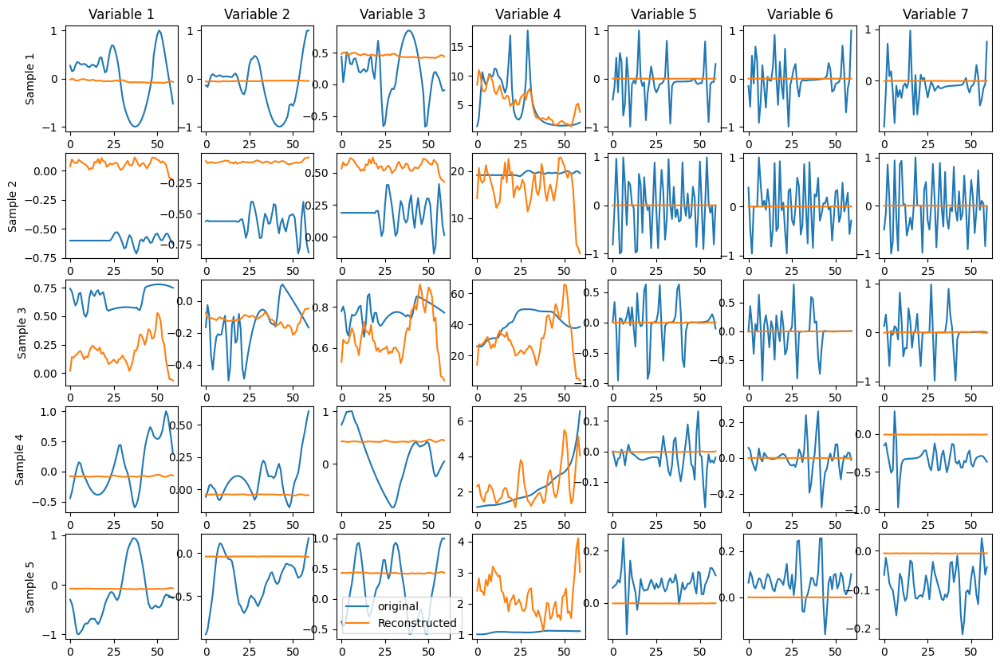

In [93]:
test_data = next(iter(dataloader))
reconstructed_data = model(test_data)

plot_reconstruction(test_data, reconstructed_data)